In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import shapely
from shapely.geometry import Polygon, Point
import leafmap.foliumap as leafmap


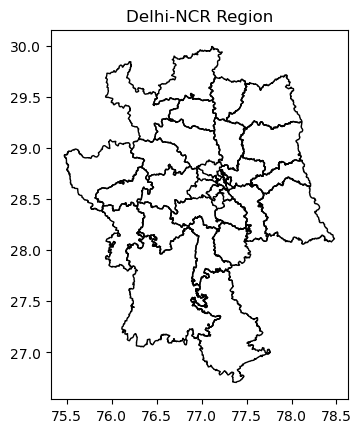

In [2]:
ncr = gpd.read_file('delhi_ncr_region.geojson')
ncr = ncr.to_crs(epsg=4326)
ncr.plot(edgecolor='black', facecolor='none')
plt.title('Delhi-NCR Region')
plt.show()


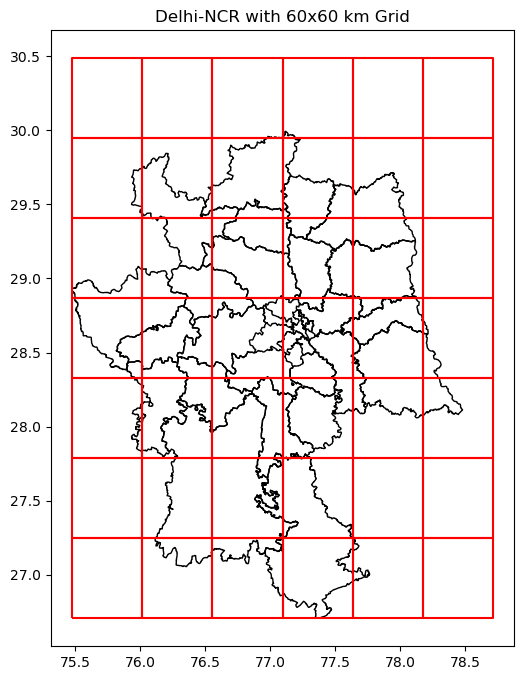

In [3]:
from shapely.geometry import box

# Bounding box of Delhi-NCR
minx, miny, maxx, maxy = ncr.total_bounds

# 60 km in degrees approximately (rough estimate, works for Delhi)
# 1 degree ≈ 111 km, so 60 km ≈ 0.54 degrees
grid_size = 0.54

grid_cells = []
x = minx
while x < maxx:
    y = miny
    while y < maxy:
        cell = box(x, y, x + grid_size, y + grid_size)
        grid_cells.append(cell)
        y += grid_size
    x += grid_size

grid = gpd.GeoDataFrame({'geometry': grid_cells}, crs='EPSG:4326')

# Plot grid on NCR boundary
fig, ax = plt.subplots(figsize=(8,8))
ncr.plot(ax=ax, edgecolor='black', facecolor='none')
grid.boundary.plot(ax=ax, color='red')
plt.title('Delhi-NCR with 60x60 km Grid')
plt.show()


In [4]:
m = leafmap.Map(center=(28.6, 77.2), zoom=8)

m.add_gdf(ncr, layer_name="Delhi NCR")
m.add_gdf(grid, layer_name="60x60 km Grid", style={"color": "red", "fillOpacity": 0})
m


In [5]:
corner_points = []
center_points = []

for poly in grid.geometry:
    minx, miny, maxx, maxy = poly.bounds
    corners = [
        Point(minx, miny), Point(maxx, miny),
        Point(minx, maxy), Point(maxx, maxy)
    ]
    center = poly.centroid
    corner_points.extend(corners)
    center_points.append(center)

corner_gdf = gpd.GeoDataFrame(geometry=corner_points, crs='EPSG:4326')
center_gdf = gpd.GeoDataFrame(geometry=center_points, crs='EPSG:4326')

m.add_gdf(corner_gdf, layer_name="Corners", style={"color": "blue"})
m.add_gdf(center_gdf, layer_name="Centers", style={"color": "green"})
m


In [7]:
import os
from shapely.geometry import Point
import geopandas as gpd

# Set your folder path
image_folder = r'C:\Users\Asus\Desktop\ML\rgb'

# List to store image data
image_data = []

# Loop through the folder and extract lat/lon from filenames
for file in os.listdir(image_folder):
    if file.endswith('.png'):
        name = file[:-4]  # Remove .png extension
        try:
            lat, lon = map(float, name.split('_'))
            image_data.append({'filename': file, 'lat': lat, 'lon': lon})
        except:
            print(f"Skipping invalid filename: {file}")

# Convert to GeoDataFrame
images_gdf = gpd.GeoDataFrame(image_data, geometry=gpd.points_from_xy([d['lon'] for d in image_data], [d['lat'] for d in image_data]), crs='EPSG:4326')

# Count before filtering
print(f"Total images before filtering: {len(images_gdf)}")


Total images before filtering: 9216


In [8]:
### Q2. Label Construction & Dataset Preparation

In [12]:
import os
import geopandas as gpd
from shapely.geometry import Point

image_folder = r"C:\Users\Asus\Desktop\ML\rgb"

image_points = []

for fname in os.listdir(image_folder):
    if fname.endswith(".png"):
        name = fname.replace('.png', '')
        try:
            lat, lon = map(float, name.split('_'))
            image_points.append(Point(lon, lat))
        except:
            pass

image_gdf = gpd.GeoDataFrame(geometry=image_points, crs='EPSG:4326')


In [13]:
import rasterio
from rasterio.windows import Window
import numpy as np

land_cover = rasterio.open(r"C:\Users\Asus\Desktop\ML\worldcover_bbox_delhi_ncr_2021.tif")

patches = []
valid_points = []

for idx, row in image_gdf.iterrows():
    lon, lat = row.geometry.x, row.geometry.y
    try:
        row_idx, col_idx = land_cover.index(lon, lat)
        window = Window(col_idx - 64, row_idx - 64, 128, 128)
        patch = land_cover.read(1, window=window)
        if patch.shape == (128, 128):
            patches.append(patch)
            valid_points.append(row)
        else:
            patches.append(None)
    except:
        patches.append(None)


In [14]:
from scipy import stats

labels = []
for patch in patches:
    if patch is None:
        labels.append(None)
    else:
        mode = stats.mode(patch.flatten(), keepdims=True)[0][0]
        labels.append(int(mode))


In [15]:
esa_to_label = {
    10: 'Trees',
    20: 'Shrubland',
    30: 'Grassland',
    40: 'Cropland',
    50: 'Built-up',
    60: 'Bare',
    70: 'Snow and ice',
    80: 'Water',
    90: 'Wetland',
    95: 'Mangroves',
    100: 'Moss/lichen'
}

text_labels = [esa_to_label.get(code, 'Unknown') if code else 'Unknown' for code in labels]


In [16]:
import geopandas as gpd

valid_gdf = gpd.GeoDataFrame(valid_points).reset_index(drop=True)
valid_gdf['label_code'] = labels
valid_gdf['label'] = text_labels

filtered_df = valid_gdf[valid_gdf['label'] != 'Unknown'].copy()


In [17]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(
    filtered_df,
    test_size=0.4,
    stratify=filtered_df['label'],
    random_state=42
)


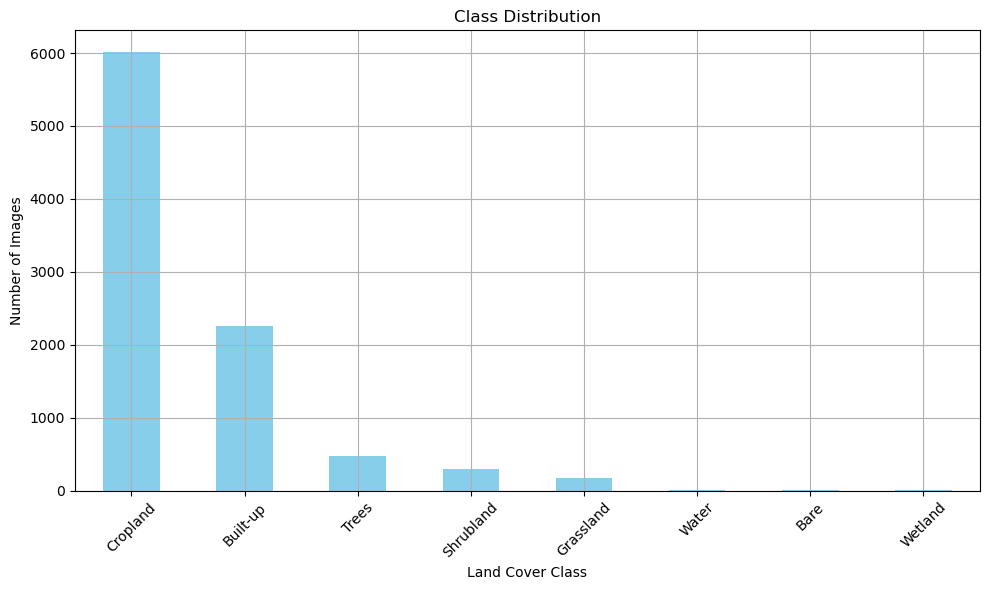

In [18]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
filtered_df['label'].value_counts().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Land Cover Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


In [19]:
###Q3. Model Training & Supervised Evaluation

In [21]:
!pip install torchmetrics


  Obtaining dependency information for torchmetrics from https://files.pythonhosted.org/packages/70/19/2d8db70030d3472dad5d49136770af949f5ed597df2c1a6a509dadc5d57d/torchmetrics-1.7.4-py3-none-any.whl.metadata
  Using cached torchmetrics-1.7.4-py3-none-any.whl.metadata (21 kB)
  Obtaining dependency information for lightning-utilities>=0.8.0 from https://files.pythonhosted.org/packages/1a/c1/31b3184cba7b257a4a3b5ca5b88b9204ccb7aa02fe3c992280899293ed54/lightning_utilities-0.14.3-py3-none-any.whl.metadata
  Using cached lightning_utilities-0.14.3-py3-none-any.whl.metadata (5.6 kB)
   ---------------------------------------- 0.0/963.5 kB ? eta -:--:--
   ---------------------------------------- 10.2/963.5 kB ? eta -:--:--
   - ------------------------------------- 30.7/963.5 kB 435.7 kB/s eta 0:00:03
   - ------------------------------------- 41.0/963.5 kB 330.3 kB/s eta 0:00:03
   -- ------------------------------------ 61.4/963.5 kB 409.6 kB/s eta 0:00:03
   --- -------------------------

In [7]:
from torchmetrics.classification import MulticlassF1Score


In [8]:
import torch
import torch.nn as nn
from torchvision import transforms, models
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import numpy as np
import pandas as pd
from torchmetrics.classification import MulticlassF1Score
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


In [13]:
import os
import rasterio
from shapely.geometry import Point
import geopandas as gpd
from sklearn.model_selection import train_test_split
from scipy import stats
import pandas as pd
import numpy as np

# Paths
image_dir = r"C:\Users\Asus\Desktop\ML\rgb"
raster_path = r"C:\Users\Asus\Desktop\ML\worldcover_bbox_delhi_ncr_2021.tif"

# Load image coordinates from filenames
image_files = [f for f in os.listdir(image_dir) if f.endswith(".png")]
coords = []
for f in image_files:
    try:
        lat, lon = map(float, f.replace(".png", "").split("_"))
        coords.append((f, lon, lat))
    except:
        continue

df = pd.DataFrame(coords, columns=["filename", "lon", "lat"])
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df["lon"], df["lat"]), crs="EPSG:4326")

# Open land cover raster
raster = rasterio.open(raster_path)

# Extract 128x128 patch & assign mode label
labels = []
final_rows = []

for idx, row in gdf.iterrows():
    lon, lat = row["lon"], row["lat"]
    try:
        x, y = raster.index(lon, lat)
        patch = raster.read(1, window=rasterio.windows.Window(x - 64, y - 64, 128, 128))
        mode_label = int(stats.mode(patch, axis=None, nan_policy='omit')[0])
        labels.append(mode_label)
        final_rows.append(row)
    except:
        continue

# Create new dataframe
labelled_df = pd.DataFrame(final_rows)
labelled_df["label"] = labels

# Train/test split
train_df, test_df = train_test_split(labelled_df, test_size=0.4, random_state=42)

# Regenerate filename column from geometry
train_df["filename"] = train_df.geometry.apply(lambda p: f"{p.y:.4f}_{p.x:.4f}.png")
test_df["filename"] = test_df.geometry.apply(lambda p: f"{p.y:.4f}_{p.x:.4f}.png")

print("Train/Test dataframes ready ✅")


Train/Test dataframes ready ✅


In [14]:
train_df["filename"] = train_df.geometry.apply(lambda p: f"{p.y:.4f}_{p.x:.4f}.png")
test_df["filename"] = test_df.geometry.apply(lambda p: f"{p.y:.4f}_{p.x:.4f}.png")


In [15]:
class LandCoverDataset(Dataset):
    def __init__(self, df, root_dir, transform=None, label_map=None):
        self.df = df.reset_index(drop=True)
        self.root_dir = root_dir
        self.transform = transform
        self.label_map = label_map or {label: idx for idx, label in enumerate(sorted(df['label'].unique()))}
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.df.loc[idx, 'filename'])
        image = Image.open(img_path).convert('RGB')
        label = self.label_map[self.df.loc[idx, 'label']]
        if self.transform:
            image = self.transform(image)
        return image, label


In [16]:
class LandCoverDataset(Dataset):
    def __init__(self, df, root_dir, transform=None, label_map=None):
        self.df = df.reset_index(drop=True)
        self.root_dir = root_dir
        self.transform = transform
        self.label_map = label_map or {label: idx for idx, label in enumerate(sorted(df['label'].unique()))}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.df.loc[idx, 'filename'])
        image = Image.open(img_path).convert('RGB')
        label = self.label_map[self.df.loc[idx, 'label']]
        if self.transform:
            image = self.transform(image)
        return image, label


In [17]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

label_map = {label: idx for idx, label in enumerate(sorted(train_df['label'].unique()))}

train_dataset = LandCoverDataset(train_df, r'C:\Users\Asus\Desktop\ML\rgb', transform, label_map)
test_dataset = LandCoverDataset(test_df, r'C:\Users\Asus\Desktop\ML\rgb', transform, label_map)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32)


In [18]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, len(label_map))
model = model.to(device)


C:\Users\Asus\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Asus\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [19]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

for epoch in range(5):
    model.train()
    total_loss = 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1} - Loss: {total_loss:.4f}")


Epoch 1 - Loss: 170.8785
Epoch 2 - Loss: 153.2393
Epoch 3 - Loss: 150.5622
Epoch 4 - Loss: 143.9990
Epoch 5 - Loss: 140.2765


In [20]:
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(1).cpu()
        all_preds.extend(preds)
        all_labels.extend(labels)


KeyError: 90

In [45]:
def compute_f1(y_true, y_pred, num_classes):
    conf = torch.zeros(num_classes, num_classes)
    for t, p in zip(y_true, y_pred):
        conf[t.long(), p.long()] += 1
    precision = conf.diag() / (conf.sum(1) + 1e-8)
    recall = conf.diag() / (conf.sum(0) + 1e-8)
    f1 = 2 * (precision * recall) / (precision + recall + 1e-8)
    return f1.mean().item()

f1_custom = compute_f1(torch.tensor(all_labels), torch.tensor(all_preds), len(label_map))
print("Custom F1 Score:", round(f1_custom, 4))


Custom F1 Score: 0.4162


In [46]:
f1_metric = MulticlassF1Score(num_classes=len(label_map), average='macro')
f1_score_torch = f1_metric(torch.tensor(all_preds), torch.tensor(all_labels))
print("torchmetrics F1 Score:", round(f1_score_torch.item(), 4))


torchmetrics F1 Score: 0.4162


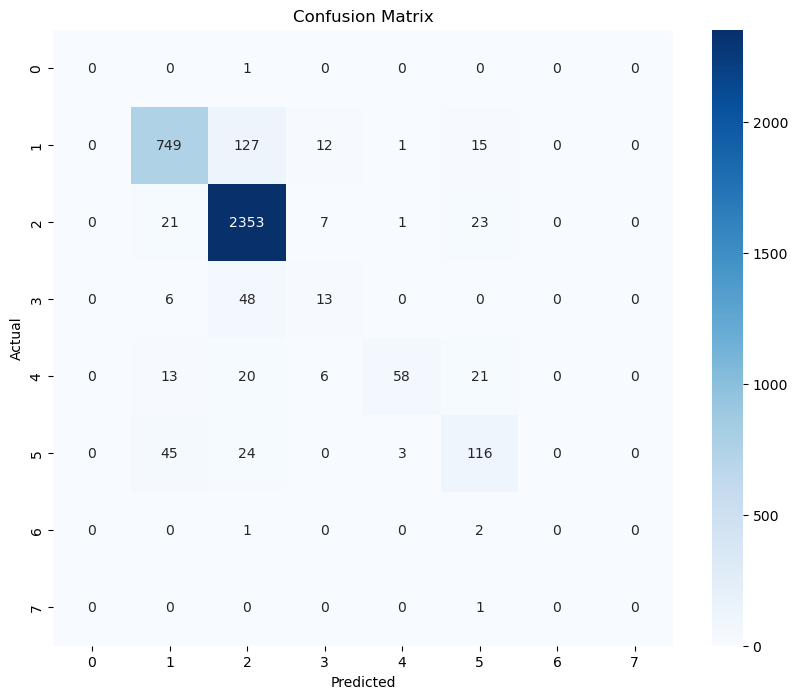

In [47]:
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


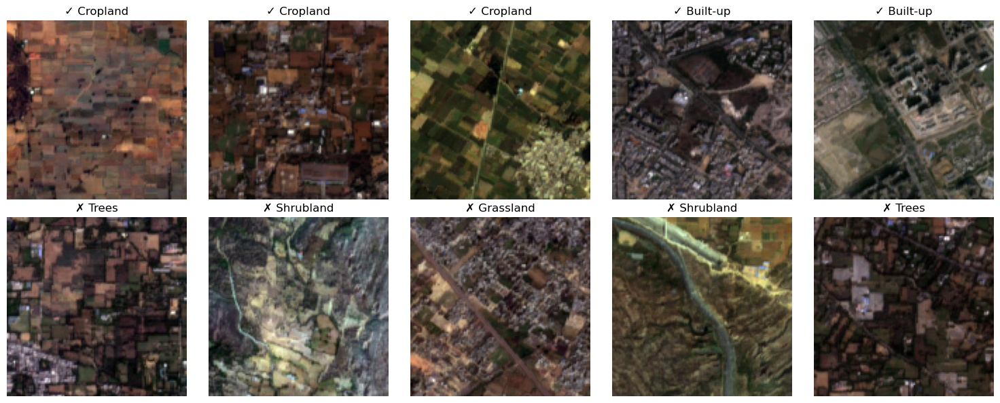

In [48]:
correct, incorrect = [], []

for i, (p, t) in enumerate(zip(all_preds, all_labels)):
    if p == t and len(correct) < 5:
        correct.append(i)
    elif p != t and len(incorrect) < 5:
        incorrect.append(i)
    if len(correct) == 5 and len(incorrect) == 5:
        break

fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, idx in enumerate(correct):
    img_path = os.path.join(r'C:\Users\Asus\Desktop\ML\rgb', test_df.iloc[idx]['filename'])
    axes[0, i].imshow(Image.open(img_path))
    axes[0, i].set_title(f"✓ {test_df.iloc[idx]['label']}")
    axes[0, i].axis('off')

for i, idx in enumerate(incorrect):
    img_path = os.path.join(r'C:\Users\Asus\Desktop\ML\rgb', test_df.iloc[idx]['filename'])
    axes[1, i].imshow(Image.open(img_path))
    axes[1, i].set_title(f"✗ {test_df.iloc[idx]['label']}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()
  
    